Since a multimodal architecture using a `Swin Transformer V2` vision encoder and a `BERT-based` text encoder showed the best results, it would be a good idea to further develop this model. As a first step, we will freeze the pretrained encoder layers and train only the newly added classification head.

All training will be performed on `Nvidia A100 GPU` in `Google Colab`.

First we need to install some extra libraries to use ROUGE as an evaluation metric.

In [ ]:
!pip install -q evaluate
!pip install -q rouge_score

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.0/84.0 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)

if gpu_info.find('failed') >= 0:
    print('Not connected to a GPU')
else:
    print(gpu_info)

Sun Jun 15 08:41:43 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   34C    P0             45W /  400W |       0MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [ ]:
import os
import kagglehub

path = kagglehub.dataset_download('adityajn105/flickr8k')

print(f'Path to dataset files: {path}')
print(f'Files and directories: {os.listdir(path)}')

Path to dataset files: /kaggle/input/flickr8k
Files and directories: ['captions.txt', 'Images']


In [ ]:
with open('/kaggle/input/flickr8k/captions.txt') as f:
    captions = f.read()

print(captions[:500])

image,caption
1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg,A girl going into a wooden building .
1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse .
1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin .
1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting
1001773457_577c3


In [ ]:
os.listdir('/kaggle/input/flickr8k/Images')[:5]

['3226254560_2f8ac147ea.jpg',
 '214543992_ce6c0d9f9b.jpg',
 '2366643786_9c9a830db8.jpg',
 '3368819708_0bfa0808f8.jpg',
 '2190227737_6e0bde2623.jpg']

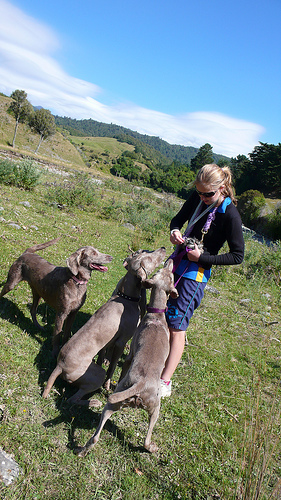

In [ ]:
from PIL import Image

Image.open('/kaggle/input/flickr8k/Images/2190227737_6e0bde2623.jpg')

In [ ]:
import io
import numpy as np
import pandas as pd

# Setting seed
np.random.seed(42)

# Load the captions string into a pandas DataFrame
buff = io.StringIO(captions)
df = pd.read_csv(buff)
# Construct the full path for each image file
df.image = df.image.apply (lambda im_path: os.path.join(path, 'Images', im_path))

df.head(10)

,image,caption
0,/kaggle/input/flickr8k/Images/1000268201_693b0...,A child in a pink dress is climbing up a set o...
1,/kaggle/input/flickr8k/Images/1000268201_693b0...,A girl going into a wooden building .
2,/kaggle/input/flickr8k/Images/1000268201_693b0...,A little girl climbing into a wooden playhouse .
3,/kaggle/input/flickr8k/Images/1000268201_693b0...,A little girl climbing the stairs to her playh...
4,/kaggle/input/flickr8k/Images/1000268201_693b0...,A little girl in a pink dress going into a woo...
5,/kaggle/input/flickr8k/Images/1001773457_577c3...,A black dog and a spotted dog are fighting
6,/kaggle/input/flickr8k/Images/1001773457_577c3...,A black dog and a tri-colored dog playing with...
7,/kaggle/input/flickr8k/Images/1001773457_577c3...,A black dog and a white dog with brown spots a...
8,/kaggle/input/flickr8k/Images/1001773457_577c3...,Two dogs of different breeds looking at each o...
9,/kaggle/input/flickr8k/Images/1001773457_577c3...,Two dogs on pavement moving toward each other .


In [ ]:
df = df.sort_values('image').reset_index(drop=True)

df.head(12).image.values

array(['/kaggle/input/flickr8k/Images/1000268201_693b08cb0e.jpg',
       '/kaggle/input/flickr8k/Images/1000268201_693b08cb0e.jpg',
       '/kaggle/input/flickr8k/Images/1000268201_693b08cb0e.jpg',
       '/kaggle/input/flickr8k/Images/1000268201_693b08cb0e.jpg',
       '/kaggle/input/flickr8k/Images/1000268201_693b08cb0e.jpg',
       '/kaggle/input/flickr8k/Images/1001773457_577c3a7d70.jpg',
       '/kaggle/input/flickr8k/Images/1001773457_577c3a7d70.jpg',
       '/kaggle/input/flickr8k/Images/1001773457_577c3a7d70.jpg',
       '/kaggle/input/flickr8k/Images/1001773457_577c3a7d70.jpg',
       '/kaggle/input/flickr8k/Images/1001773457_577c3a7d70.jpg',
       '/kaggle/input/flickr8k/Images/1002674143_1b742ab4b8.jpg',
       '/kaggle/input/flickr8k/Images/1002674143_1b742ab4b8.jpg'],
      dtype=object)

In [ ]:
len(df), df.image.nunique(), 8091 // 2 + 1, 8091 // 2

(40455, 8091, 4046, 4045)

In [ ]:
df['random_rank'] = df.groupby('image').image.transform(
    lambda x: np.random.permutation(len(x))
)
df['is_train'] = df['random_rank'] < 4

df.head(12)

,image,caption,random_rank,is_train
0,/kaggle/input/flickr8k/Images/1000268201_693b0...,A child in a pink dress is climbing up a set o...,1,True
1,/kaggle/input/flickr8k/Images/1000268201_693b0...,A girl going into a wooden building .,4,False
2,/kaggle/input/flickr8k/Images/1000268201_693b0...,A little girl climbing into a wooden playhouse .,2,True
3,/kaggle/input/flickr8k/Images/1000268201_693b0...,A little girl climbing the stairs to her playh...,0,True
4,/kaggle/input/flickr8k/Images/1000268201_693b0...,A little girl in a pink dress going into a woo...,3,True
5,/kaggle/input/flickr8k/Images/1001773457_577c3...,Two dogs on pavement moving toward each other .,3,True
6,/kaggle/input/flickr8k/Images/1001773457_577c3...,A black dog and a white dog with brown spots a...,1,True
7,/kaggle/input/flickr8k/Images/1001773457_577c3...,Two dogs of different breeds looking at each o...,2,True
8,/kaggle/input/flickr8k/Images/1001773457_577c3...,A black dog and a spotted dog are fighting,0,True
9,/kaggle/input/flickr8k/Images/1001773457_577c3...,A black dog and a tri-colored dog playing with...,4,False


In [ ]:
# Check the number of samples in the train set
df.is_train.sum()

np.int64(32364)

In [ ]:
train_df = df[df.is_train]

res_df = df[~df.is_train]
res_df = res_df.sample(frac=1, random_state=42).reset_index(drop=True)

test_size = 4046
test_df = res_df.iloc[:test_size].reset_index(drop=True)
valid_df = res_df.iloc[test_size:].reset_index(drop=True)

# Check the distribution
len(train_df), len(test_df), len(valid_df)

(32364, 4046, 4045)

In [ ]:
import torch
import warnings
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings('ignore')
sns.set()

In [ ]:
from transformers import AutoTokenizer

llm_id = 'google-bert/bert-base-uncased'
tokenizer = AutoTokenizer.from_pretrained(llm_id)

tokenizer.add_special_tokens({'pad_token': '[PAD]'})

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

0

In [ ]:
def get_num_tokens(text: str) -> int:
    return len(tokenizer(text).input_ids)

df['tokens_per_description'] = df.caption.map(get_num_tokens)

df.head()

,image,caption,random_rank,is_train,tokens_per_description
0,/kaggle/input/flickr8k/Images/1000268201_693b0...,A child in a pink dress is climbing up a set o...,1,True,20
1,/kaggle/input/flickr8k/Images/1000268201_693b0...,A girl going into a wooden building .,4,False,10
2,/kaggle/input/flickr8k/Images/1000268201_693b0...,A little girl climbing into a wooden playhouse .,2,True,11
3,/kaggle/input/flickr8k/Images/1000268201_693b0...,A little girl climbing the stairs to her playh...,0,True,12
4,/kaggle/input/flickr8k/Images/1000268201_693b0...,A little girl in a pink dress going into a woo...,3,True,15


In [ ]:
df.tokens_per_description.max()

42

In [ ]:
from torch.utils.data import Dataset


class ImageCaptionDataset(Dataset):
    """Dataset that returns prcessed images with LVM processor and LLM tokenizer"""

    def __init__(self, df, processor, tokenizer, max_length=42):
        self.images = df.image.values.tolist()
        self.captions = df.caption.values.tolist()
        self.processor = processor
        self.tokenizer = tokenizer
        # Tokens from the text + [CLS] + [SEP] tokens
        self.max_length = max_length + 2

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        # Reading the image and getting pixel values
        image = Image.open(self.images[idx]).convert('RGB')
        im_inputs = self.processor(images=image, return_tensors='pt')
        pixel_values = im_inputs['pixel_values'].squeeze(0)

        # Tokenizing the caption and getting input ids
        caption = self.captions[idx]
        text_inputs = self.tokenizer(
            caption,
            add_special_tokens=True,
            padding='max_length',
            max_length=self.max_length,
            truncation=True
        )

        input_ids = torch.tensor(text_inputs.input_ids)
        input_ids[input_ids == tokenizer.pad_token_id] = -100

        return pixel_values, input_ids

In [ ]:
from transformers import AutoImageProcessor

lvm_id = 'microsoft/swinv2-base-patch4-window16-256'
processor = AutoImageProcessor.from_pretrained(lvm_id, use_fast=True)

train_ds = ImageCaptionDataset(train_df, processor, tokenizer)
test_ds = ImageCaptionDataset(test_df, processor, tokenizer)
valid_ds = ImageCaptionDataset(valid_df, processor, tokenizer)

preprocessor_config.json:   0%|          | 0.00/240 [00:00<?, ?B/s]

In [ ]:
# Verify the output of the dataset
train_ds[0]

(tensor([[[-0.8164, -0.2171,  0.0056,  ..., -2.0494, -2.0152, -2.0323],
          [-0.8678, -0.1828,  0.0227,  ..., -1.9980, -1.9809, -1.9295],
          [-0.9020, -0.1314,  0.0056,  ..., -1.9809, -2.0152, -1.8610],
          ...,
          [ 1.0673,  0.0056,  0.5878,  ...,  1.1187,  0.6906,  0.7077],
          [ 0.9817,  1.2043,  1.8893,  ...,  1.0331,  0.7419,  0.7591],
          [ 1.4269,  1.6495,  0.6563,  ...,  0.9474,  0.7419,  0.7762]],
 
         [[-0.6176,  0.2227,  0.4328,  ..., -2.0007, -1.9132, -1.9132],
          [-0.6877,  0.2227,  0.4853,  ..., -1.9307, -1.8606, -1.7381],
          [-0.7752,  0.2752,  0.4503,  ..., -1.8782, -1.7906, -1.4930],
          ...,
          [-0.1625, -1.1429, -0.0924,  ...,  1.4832,  1.1506,  1.1856],
          [-0.3725,  0.7129,  1.2206,  ...,  1.3957,  1.1681,  1.1856],
          [ 0.0826,  0.7129, -0.4601,  ...,  1.3081,  1.1681,  1.1856]],
 
         [[-0.1835,  0.3393,  0.6705,  ..., -1.7696, -1.7173, -1.7347],
          [-0.3055,  0.3742,

In [ ]:
from torch.utils.data import DataLoader

batch_size = 32
cpu_count = os.cpu_count() # 12
params = dict(
    shuffle=True,
    batch_size=batch_size,
    num_workers=cpu_count,
    pin_memory=True
)

train_dl = DataLoader(train_ds, **params)
test_dl = DataLoader(test_ds, **params)
valid_dl = DataLoader(valid_ds, **params)

In [ ]:
from transformers import VisionEncoderDecoderModel


model = VisionEncoderDecoderModel.from_encoder_decoder_pretrained(lvm_id, llm_id)

# ids
model.config.decoder_start_token_id = tokenizer.cls_token_id
model.config.pad_token_id = tokenizer.pad_token_id
model.config.vocab_size = model.config.decoder.vocab_size

for param in model.encoder.parameters():
    param.requires_grad = False

for param in model.decoder.parameters():
    param.requires_grad = True

config.json:   0%|          | 0.00/69.9k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/352M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/352M [00:00<?, ?B/s]

Some weights of BertLMHeadModel were not initialized from the model checkpoint at google-bert/bert-base-uncased and are newly initialized: ['bert.encoder.layer.0.crossattention.output.LayerNorm.bias', 'bert.encoder.layer.0.crossattention.output.LayerNorm.weight', 'bert.encoder.layer.0.crossattention.output.dense.bias', 'bert.encoder.layer.0.crossattention.output.dense.weight', 'bert.encoder.layer.0.crossattention.self.key.bias', 'bert.encoder.layer.0.crossattention.self.key.weight', 'bert.encoder.layer.0.crossattention.self.query.bias', 'bert.encoder.layer.0.crossattention.self.query.weight', 'bert.encoder.layer.0.crossattention.self.value.bias', 'bert.encoder.layer.0.crossattention.self.value.weight', 'bert.encoder.layer.1.crossattention.output.LayerNorm.bias', 'bert.encoder.layer.1.crossattention.output.LayerNorm.weight', 'bert.encoder.layer.1.crossattention.output.dense.bias', 'bert.encoder.layer.1.crossattention.output.dense.weight', 'bert.encoder.layer.1.crossattention.self.key.bi

In [ ]:
model

VisionEncoderDecoderModel(
  (encoder): Swinv2Model(
    (embeddings): Swinv2Embeddings(
      (patch_embeddings): Swinv2PatchEmbeddings(
        (projection): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      )
      (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): Swinv2Encoder(
      (layers): ModuleList(
        (0): Swinv2Stage(
          (blocks): ModuleList(
            (0): Swinv2Layer(
              (attention): Swinv2Attention(
                (self): Swinv2SelfAttention(
                  (continuous_position_bias_mlp): Sequential(
                    (0): Linear(in_features=2, out_features=512, bias=True)
                    (1): ReLU(inplace=True)
                    (2): Linear(in_features=512, out_features=4, bias=False)
                  )
                  (query): Linear(in_features=128, out_features=128, bias=True)
                  (key): Linear(in_features=128, out_features=128, 

In [ ]:
import evaluate
from torch.optim import AdamW
from transformers import get_scheduler

epochs = 15
trainable_parameters = filter(lambda p: p.requires_grad, model.parameters())
optimizer = torch.optim.AdamW(trainable_parameters, lr=5e-5)
num_training_steps = epochs * len(train_dl)
num_warmup_steps = num_training_steps // 5

scheduler = get_scheduler(name='linear', optimizer=optimizer, num_warmup_steps=num_warmup_steps, num_training_steps=num_training_steps)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

metric = evaluate.load('rouge')

In [ ]:
from tqdm import tqdm

def evaluate_with_rouge(model, dl, tokenizer, metric, device):
    """
     Method to evaluate model's performance on a given dataset using the ROUGE metric

    :param model: The model to evaluate
    :param dl: The DataLoader for the evaluation data
    :param tokenizer: The tokenizer used to decode predictions and labels
    :param metric: The ROUGE metric object from the `evaluate` library
    :param device: The device (CPU or CUDA) for evaluation
    :return: A dictionary with the computed metrics: rouge1, rouge2, rougeL and rougeLsum
    """
    model.eval()

    progress_bar = tqdm(dl, desc='Calculating Rouge', leave=False)

    for pixel_values, input_ids in progress_bar:
        pixel_values = pixel_values.to(device)
        labels = input_ids.to(device)

        # Disable gradient calculation for faster and less memory-intensive inference
        with torch.no_grad():
            outputs = model(
                pixel_values=pixel_values,
                labels=labels
            )

        # Get the most likely token ID for each position in the sequence
        logits = outputs.logits
        predictions = torch.argmax(logits, dim=-1)

        # Decode the predicted token IDs into text
        predictions = tokenizer.batch_decode(predictions, skip_special_tokens=True)
        # Minor cleanup on the predictions to improve scoring alignment
        predictions = [pred_caption.replace('.', '') for pred_caption in predictions]
        # Labels use -100 to mask padding, replace with [PAD] token id for correct decoding
        references = [
            tokenizer.decode(
                [tokenizer.pad_token_id if token == -100 else token for token in reference],
                skip_special_tokens=True
            )
            for reference in labels.tolist()
        ]
        # Add the current batch of predictions and references to the metric accumulator
        metric.add_batch(predictions=predictions, references=references)

    return metric.compute()

In [ ]:
def train_one_epoch(model, dl, optimizer, scheduler, device, tokenizer, metric):
    """
    Function that trains the model for a single epoch

    :param model: The model to be trained
    :param dl: DataLoader for the training data
    :param optimizer: The optimizer for updating model weights
    :param scheduler: The learning rate scheduler
    :param device: The device for training
    :param tokenizer: BERT tokenizer for decoding
    :param metric: The metric object to evaluate rouge1, rouge2, rougeL and rougeLsum
    :return: A dictionary with loss and computed metrics: rouge1, rouge2, rougeL and rougeLsum
    """
    model.train()

    total_loss = 0
    progress_bar = tqdm(dl, desc='Training', leave=False)

    for pixel_values, input_ids in progress_bar:
        # Move data to the specified computation device.
        pixel_values = pixel_values.to(device)
        labels = input_ids.to(device)

        # Perform a forward pass through the model.
        # The model returns outputs including the loss.
        outputs = model(
            pixel_values=pixel_values,
            labels=labels
        )
        loss = outputs.loss

        # Backpropagation: compute gradients, update weights, and clear gradients.
        loss.backward()
        optimizer.step()
        scheduler.step()
        optimizer.zero_grad()

        # Update the progress bar with the loss for the current batch.
        progress_bar.set_postfix(loss=loss.item())

        total_loss += loss.item()

    # Calculate the average loss over all batches.
    avg_loss = total_loss / len(dl)

    # Evaluate the model on the training data at the end of the epoch.
    rouge_scores = evaluate_with_rouge(model, dl, tokenizer, metric, device)

    return {'loss': avg_loss, **rouge_scores}

In [ ]:
def evaluate(model, dl, device, tokenizer, metric):
    """
    Method to evaluate the model on a given dataset

    :param model: The model to evaluate
    :param dl: DataLoader for the evaluation data
    :param device: The device for evaluation
    :param tokenizer: BERT tokenizer for decoding predictions
    :param metric: The metric object to evaluate rouge1, rouge2, rougeL and rougeLsum
    :return: A dictionary with loss and computed metrics: rouge1, rouge2, rougeL and rougeLsum
    """
    model.eval()

    total_loss = 0
    progress_bar = tqdm(dl, desc='Evaluating', leave=False)

    for pixel_values, input_ids in progress_bar:
        pixel_values = pixel_values.to(device)
        labels = input_ids.to(device)

        # Disable gradient calculation for inference.
        with torch.no_grad():
            outputs = model(
                pixel_values=pixel_values,
                labels=labels
            )

        # Accumulate the loss for the batch.
        loss = outputs.loss
        total_loss += loss.item()

        # Update the progress bar with the current batch's loss.
        progress_bar.set_postfix(loss=loss.item())

    # Calculate the average loss across all batches.
    avg_loss = total_loss / len(dl)

    # Use the separate function to get ROUGE scores for the whole dataset.
    rouge_scores = evaluate_with_rouge(model, dl, tokenizer, metric, device)

    # Return a dictionary with the average loss and the ROUGE scores.
    return {'loss': avg_loss, **rouge_scores}

In [ ]:
class History:
    """Plcaholder to store training metrics and loss in a structured format"""

    def __init__(self):
        self._history = {'loss': [], 'rouge1': [], 'rouge2': [], 'rougeL': [], 'rougeLsum': []}

    def update(self, metrics):
        self._history ['loss'].append(metrics.get('loss', 0.0))
        self._history ['rouge1'].append(metrics.get('rouge1', 0.0))
        self._history ['rouge2'].append(metrics.get('rouge2', 0.0))
        self._history ['rougeL'].append(metrics.get('rougeL', 0.0))
        self._history ['rougeLsum'].append(metrics.get('rougeLsum', 0.0))

    def to_df(self):
        return pd.DataFrame(self._history)

    @property
    def hist_metrics(self):
        return self._history

In [ ]:
train_history = History()
test_history = History()

for epoch in range(1, epochs + 1):
    print(f'Epoch {epoch}/{epochs}')

    train_metrics = train_one_epoch(model, train_dl, optimizer, scheduler, device, tokenizer, metric)
    test_metrics = evaluate(model, test_dl, device, tokenizer, metric)

    print(f"Train | Loss: {train_metrics['loss']:.3f} | Rouge1: {train_metrics['rouge1']:.5f} | Rouge2: {train_metrics['rouge2']:.5f} | RougeL: {train_metrics['rougeL']:.5f} | RougeLsum: {train_metrics['rougeLsum']:.5f}")
    print(f" Test | Loss: {test_metrics['loss']:.3f} | Rouge1: {test_metrics['rouge1']:.5f} | Rouge2: {test_metrics['rouge2']:.5f} | RougeL: {test_metrics['rougeL']:.5f} | RougeLsum: {test_metrics['rougeLsum']:.5f}\n")

    train_history.update(train_metrics)
    test_history.update(test_metrics)

    model.save_pretrained(f'model_epoch_{epoch}')

Epoch 1/15


Training:   0%|          | 0/1012 [00:00<?, ?it/s]We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
`loss_type=None` was set in the config but it is unrecognised.Using the default loss: `ForCausalLMLoss`.


Train | Loss: 5.661 | Rouge1: 0.27287 | Rouge2: 0.03539 | RougeL: 0.23953 | RougeLsum: 0.23951
 Test | Loss: 4.202 | Rouge1: 0.27468 | Rouge2: 0.03483 | RougeL: 0.24158 | RougeLsum: 0.24159

Epoch 2/15


Train | Loss: 3.903 | Rouge1: 0.32946 | Rouge2: 0.08472 | RougeL: 0.29862 | RougeLsum: 0.29863
 Test | Loss: 3.546 | Rouge1: 0.32546 | Rouge2: 0.08122 | RougeL: 0.29541 | RougeLsum: 0.29547

Epoch 3/15


Train | Loss: 3.450 | Rouge1: 0.31320 | Rouge2: 0.08861 | RougeL: 0.28436 | RougeLsum: 0.28439
 Test | Loss: 3.319 | Rouge1: 0.30326 | Rouge2: 0.08216 | RougeL: 0.27548 | RougeLsum: 0.27550

Epoch 4/15


Train | Loss: 3.164 | Rouge1: 0.31042 | Rouge2: 0.09395 | RougeL: 0.28084 | RougeLsum: 0.28078
 Test | Loss: 3.169 | Rouge1: 0.28938 | Rouge2: 0.07947 | RougeL: 0.26171 | RougeLsum: 0.26169

Epoch 5/15


Train | Loss: 2.912 | Rouge1: 0.37438 | Rouge2: 0.12642 | RougeL: 0.34297 | RougeLsum: 0.34299
 Test | Loss: 3.102 | Rouge1: 0.33969 | Rouge2: 0.09946 | RougeL: 0.30894 | RougeLsum: 0.30911

Epoch 6/15


Train | Loss: 2.686 | Rouge1: 0.40385 | Rouge2: 0.14633 | RougeL: 0.37324 | RougeLsum: 0.37324
 Test | Loss: 3.085 | Rouge1: 0.34714 | Rouge2: 0.10398 | RougeL: 0.31848 | RougeLsum: 0.31856

Epoch 7/15


Train | Loss: 2.471 | Rouge1: 0.36569 | Rouge2: 0.14698 | RougeL: 0.33400 | RougeLsum: 0.33397
 Test | Loss: 3.083 | Rouge1: 0.29839 | Rouge2: 0.08771 | RougeL: 0.26752 | RougeLsum: 0.26746

Epoch 8/15


Train | Loss: 2.269 | Rouge1: 0.41848 | Rouge2: 0.18491 | RougeL: 0.38778 | RougeLsum: 0.38779
 Test | Loss: 3.109 | Rouge1: 0.32341 | Rouge2: 0.09899 | RougeL: 0.29233 | RougeLsum: 0.29224

Epoch 9/15


Train | Loss: 2.085 | Rouge1: 0.43548 | Rouge2: 0.21041 | RougeL: 0.40449 | RougeLsum: 0.40452
 Test | Loss: 3.143 | Rouge1: 0.32159 | Rouge2: 0.09786 | RougeL: 0.28785 | RougeLsum: 0.28792

Epoch 10/15


Train | Loss: 1.919 | Rouge1: 0.45527 | Rouge2: 0.24184 | RougeL: 0.42979 | RougeLsum: 0.42976
 Test | Loss: 3.190 | Rouge1: 0.31924 | Rouge2: 0.09805 | RougeL: 0.28811 | RougeLsum: 0.28783

Epoch 11/15


Train | Loss: 1.777 | Rouge1: 0.47876 | Rouge2: 0.26987 | RougeL: 0.45195 | RougeLsum: 0.45189
 Test | Loss: 3.239 | Rouge1: 0.32448 | Rouge2: 0.10038 | RougeL: 0.29019 | RougeLsum: 0.29012

Epoch 12/15


Train | Loss: 1.656 | Rouge1: 0.47851 | Rouge2: 0.28392 | RougeL: 0.45402 | RougeLsum: 0.45402
 Test | Loss: 3.287 | Rouge1: 0.31497 | Rouge2: 0.09811 | RougeL: 0.28159 | RougeLsum: 0.28152

Epoch 13/15


Train | Loss: 1.558 | Rouge1: 0.47732 | Rouge2: 0.29505 | RougeL: 0.45388 | RougeLsum: 0.45384
 Test | Loss: 3.317 | Rouge1: 0.30666 | Rouge2: 0.09384 | RougeL: 0.27273 | RougeLsum: 0.27268

Epoch 14/15


Train | Loss: 1.477 | Rouge1: 0.49612 | Rouge2: 0.31339 | RougeL: 0.47353 | RougeLsum: 0.47352
 Test | Loss: 3.363 | Rouge1: 0.31362 | Rouge2: 0.09596 | RougeL: 0.28007 | RougeLsum: 0.28011

Epoch 15/15


Train | Loss: 1.421 | Rouge1: 0.50379 | Rouge2: 0.32149 | RougeL: 0.48173 | RougeLsum: 0.48177
 Test | Loss: 3.378 | Rouge1: 0.31677 | Rouge2: 0.09742 | RougeL: 0.28243 | RougeLsum: 0.28238



In [ ]:
train_history.to_df()

,loss,rouge1,rouge2,rougeL,rougeLsum
0,5.660659,0.272869,0.035393,0.239534,0.239506
1,3.903457,0.329459,0.084718,0.298621,0.298631
2,3.449696,0.313204,0.088611,0.284363,0.284387
3,3.163720,0.310417,0.093947,0.280845,0.280779
4,2.912030,0.374379,0.126417,0.342966,0.342989
5,2.685937,0.403854,0.146334,0.373237,0.373238
6,2.471493,0.365686,0.146979,0.334001,0.333970
7,2.269479,0.418476,0.184909,0.387777,0.387791
8,2.085192,0.435478,0.210411,0.404491,0.404523
9,1.919265,0.455266,0.241844,0.429786,0.429764


In [ ]:
test_history.to_df()

,loss,rouge1,rouge2,rougeL,rougeLsum
0,4.202389,0.274677,0.034828,0.241578,0.241587
1,3.545651,0.325459,0.081218,0.295413,0.295468
2,3.319413,0.303262,0.082155,0.275483,0.275498
3,3.169485,0.289378,0.079466,0.261713,0.261688
4,3.102225,0.339690,0.099460,0.308939,0.309109
5,3.085324,0.347137,0.103981,0.318481,0.318565
6,3.083178,0.298393,0.087708,0.267519,0.267460
7,3.109041,0.323411,0.098986,0.292331,0.292241
8,3.142676,0.321593,0.097863,0.287852,0.287917
9,3.189504,0.319245,0.098055,0.288108,0.287834


In [ ]:
pd.DataFrame(evaluate(model, train_dl, device, tokenizer, metric), index=['Train Metrics']).T

,Train Metrics
loss,1.038951
rouge1,0.503857
rouge2,0.321448
rougeL,0.481797
rougeLsum,0.481807


In [ ]:
pd.DataFrame(evaluate(model, test_dl, device, tokenizer, metric), index=['Test Metrics']).T

,Test Metrics
loss,3.380144
rouge1,0.316756
rouge2,0.097395
rougeL,0.282459
rougeLsum,0.282483


In [ ]:
pd.DataFrame(evaluate(model, valid_dl, device, tokenizer, metric), index=['Validation Metrics']).T

,Validation Metrics
loss,3.438105
rouge1,0.313704
rouge2,0.094720
rougeL,0.278651
rougeLsum,0.278706


In [ ]:
model.eval()

In [ ]:
# Start every new caption with the special [CLS] token, otherwise the generating will fail
model.generation_config.decoder_start_token_id = tokenizer.cls_token_id

In [ ]:
pixel_values = train_ds[3][0].unsqueeze(0)

# Trying to generate a caption
predictions = tokenizer.decode(model.generate(pixel_values=pixel_values.to(device))[0], skip_special_tokens=True)
caption = predictions.replace('.', '')

caption

'a girl a climbing set a little little in walker'

In [ ]:
# Select random images from the validation set
ids = np.random.choice(np.arange(len(valid_dl)), 15, replace=False).astype(int)

ids

array([125,  26, 119,  61, 102, 101,  23,  42, 111,  97, 122,  48,  54,
        16,  95])

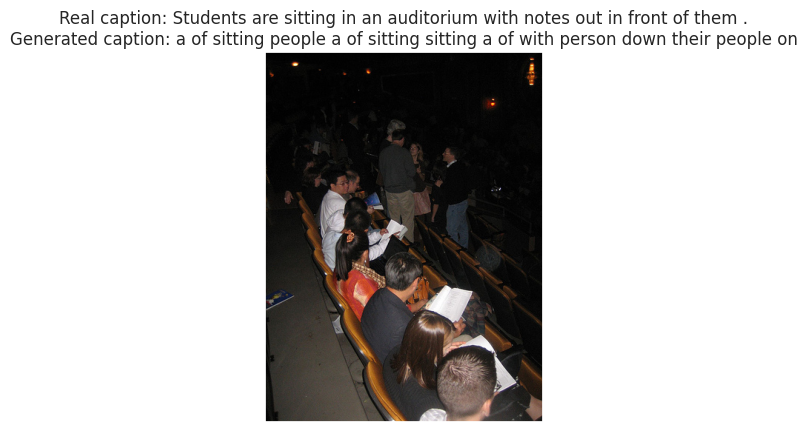

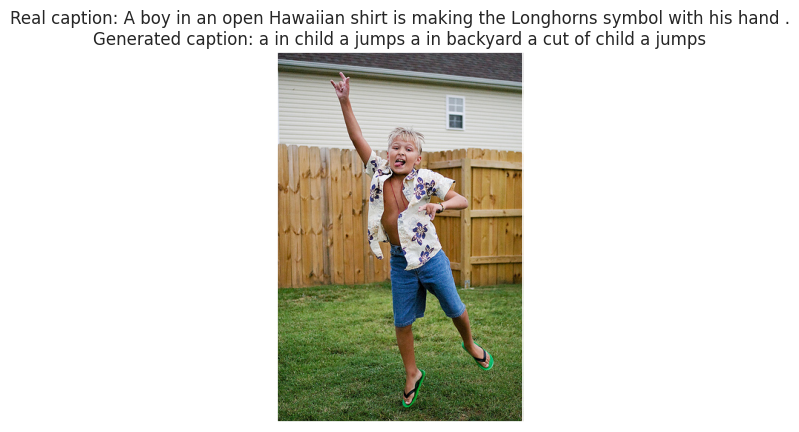

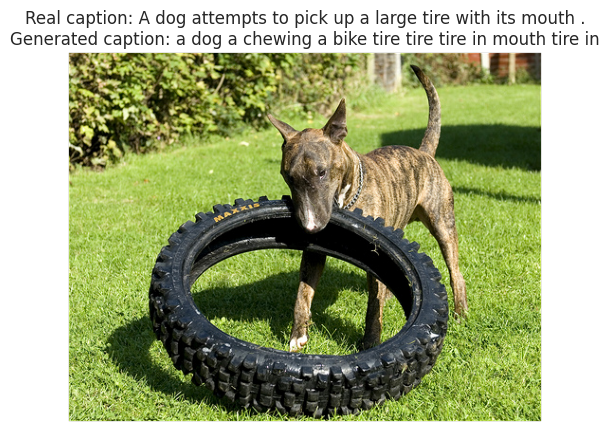

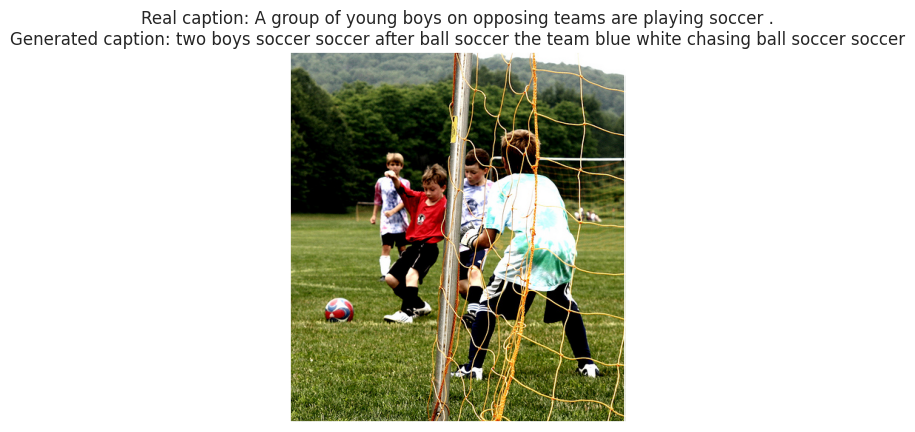

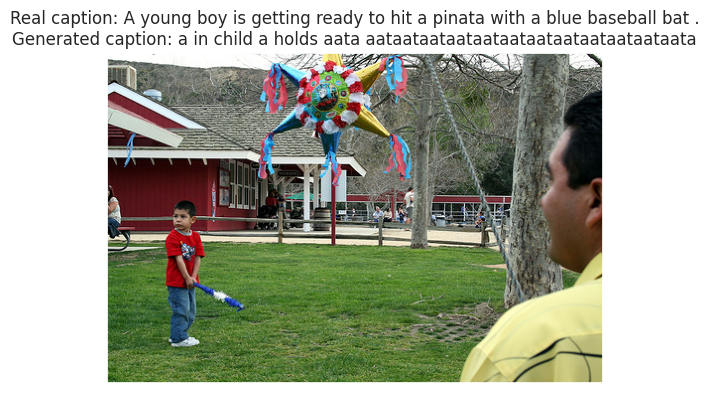

...

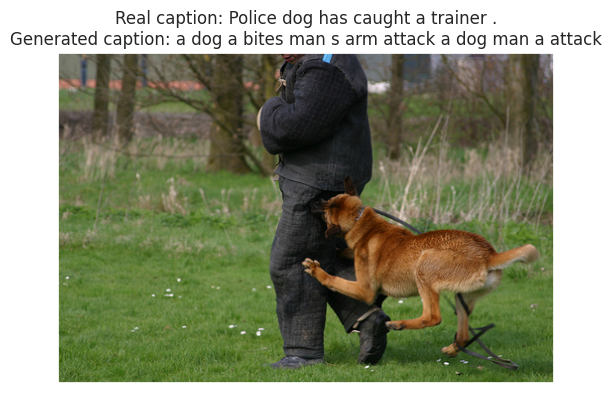

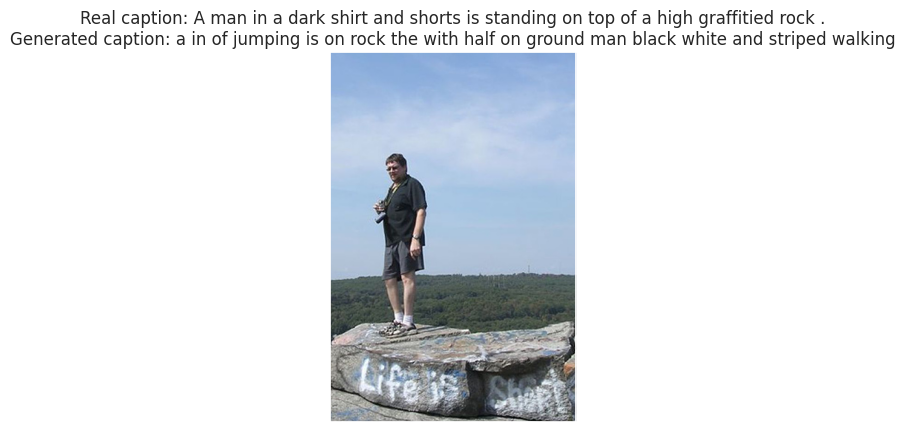

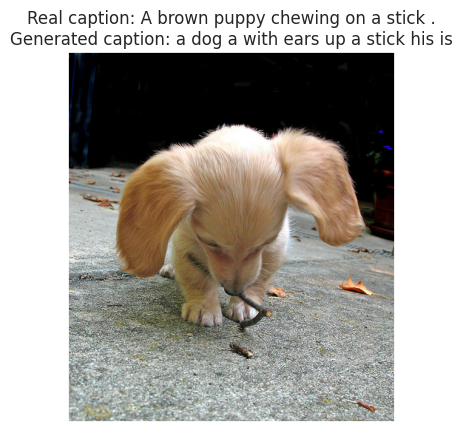

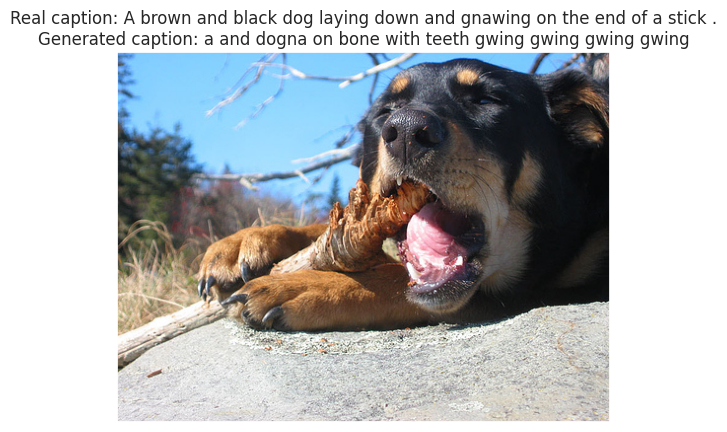

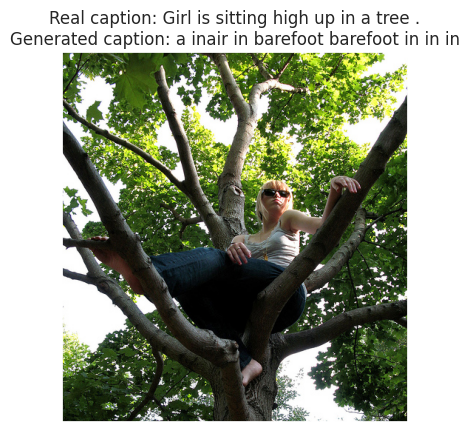

In [ ]:
for i in ids:
    pixel_values = valid_ds[i][0].unsqueeze(0).to(device)
    predictions = tokenizer.decode(model.generate(pixel_values=pixel_values)[0], skip_special_tokens=True)
    fact = valid_df.loc[int(i), 'caption']
    caption = predictions.replace('.', '').strip()

    im = plt.imread(valid_df.iloc[i].image)
    title = f'Real caption: {fact}\nGenerated caption: {caption}'

    plt.imshow(im)
    plt.title(title)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.show()

In [ ]:
from transformers import VisionEncoderDecoderModel, AutoTokenizer, AutoImageProcessor

model_directory = 'model_epoch_3'
model = VisionEncoderDecoderModel.from_pretrained(model_directory).to(device)
model.generation_config.decoder_start_token_id = tokenizer.cls_token_id

model.eval()

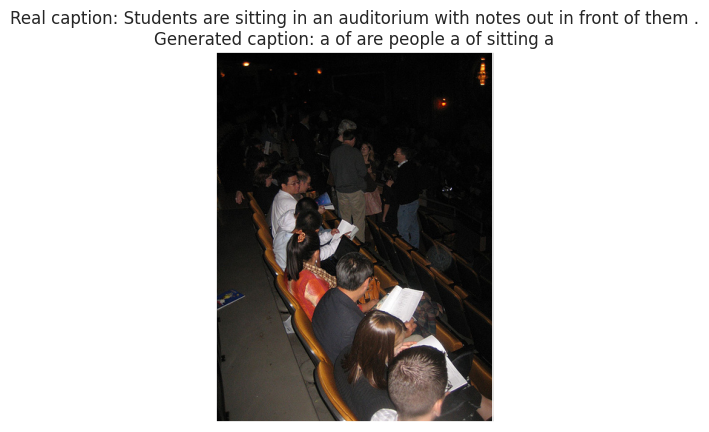

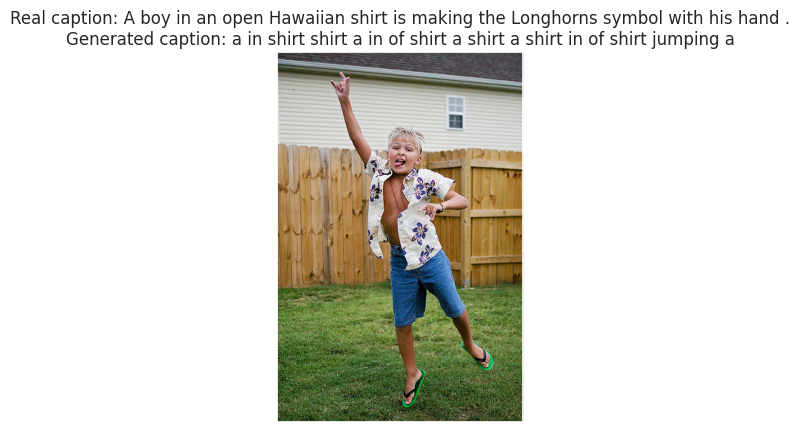

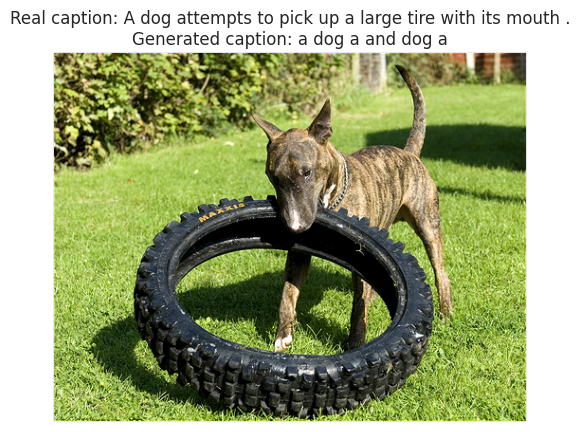

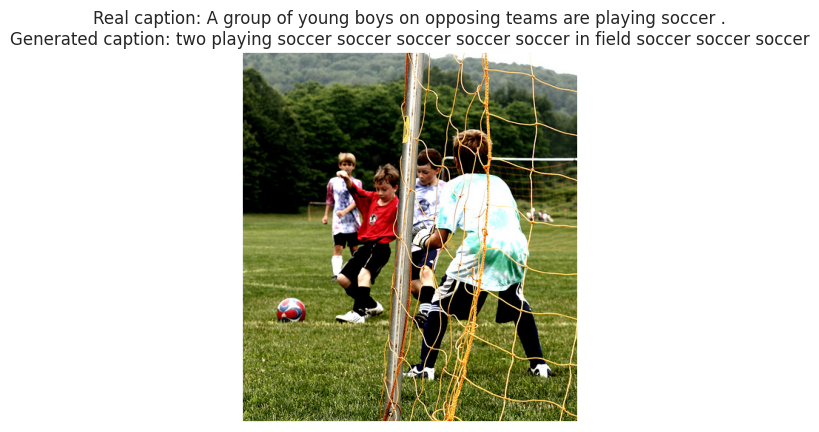

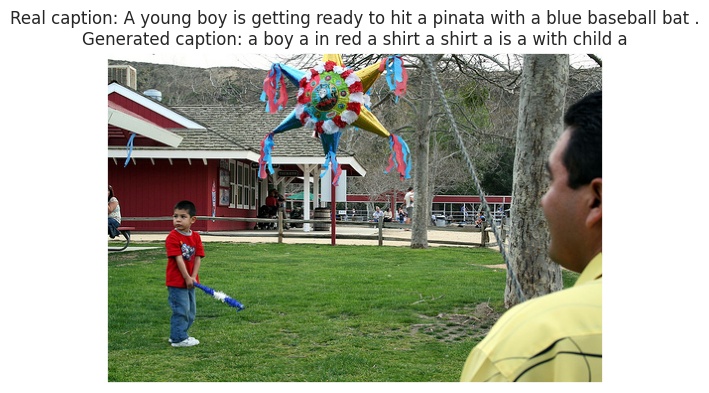

...

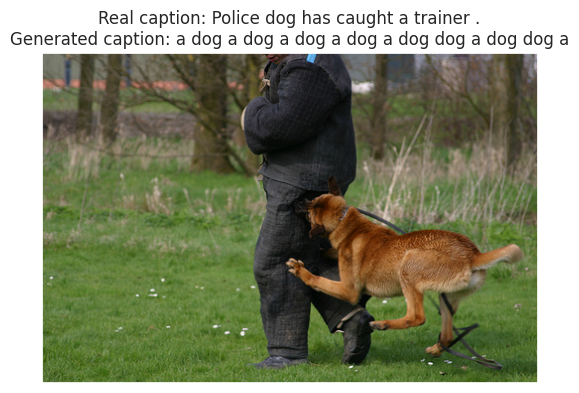

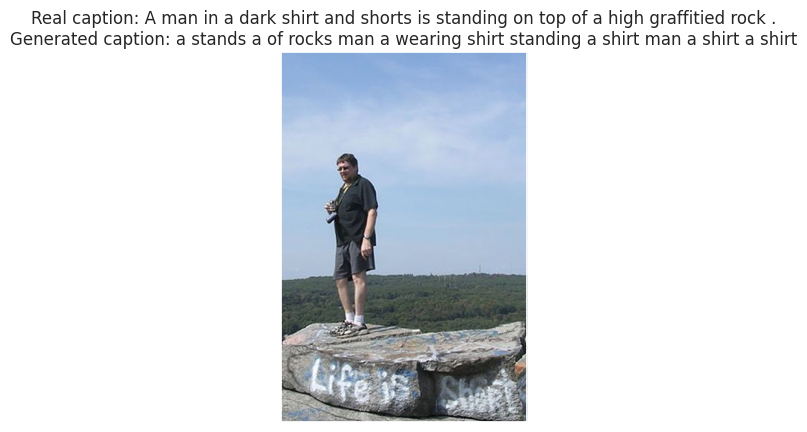

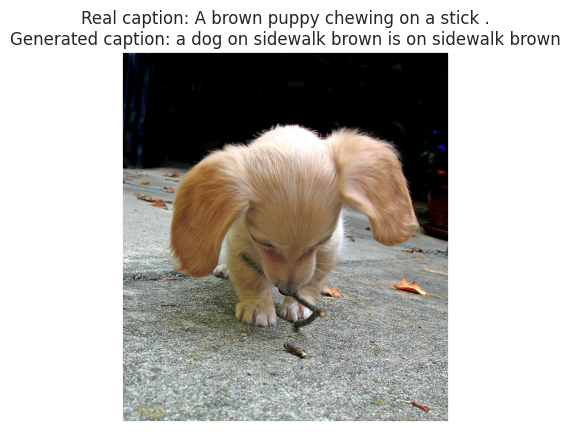

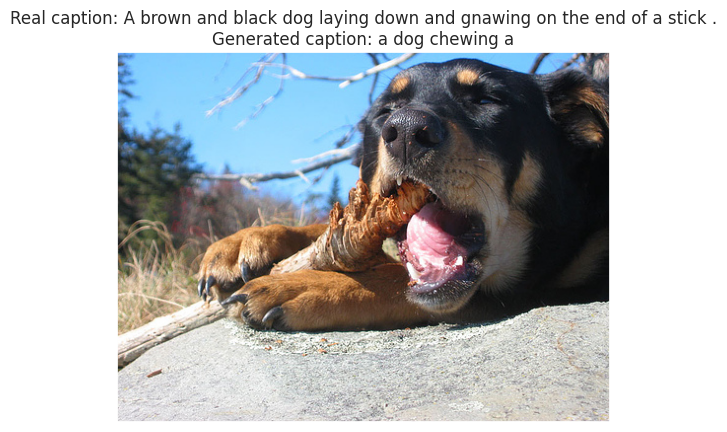

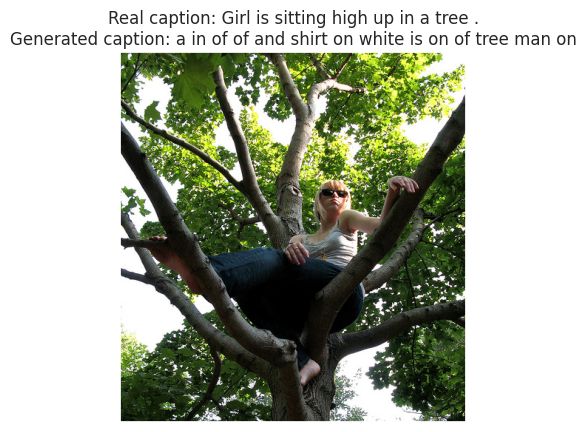

In [ ]:
for i in ids:
    pixel_values = valid_ds[i][0].unsqueeze(0).to(device)
    predictions = tokenizer.decode(model.generate(pixel_values=pixel_values)[0], skip_special_tokens=True)
    fact = valid_df.loc[int(i), 'caption']
    caption = predictions.replace('.', '').strip()

    im = plt.imread(valid_df.iloc[i].image)
    title = f'Real caption: {fact}\nGenerated caption: {caption}'

    plt.imshow(im)
    plt.title(title)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.show()

Almost the same results.